In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math,warnings,pickle,datetime,time,os,gzip
from scipy import stats
from scipy.stats import ttest_ind,levene,anderson,shapiro,mannwhitneyu,f_oneway,kruskal,chi2_contingency,fisher_exact
from statsmodels.stats.contingency_tables import StratifiedTable
from itertools import combinations,permutations,product
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler,MinMaxScaler,OneHotEncoder,PowerTransformer,label_binarize
from sklearn.model_selection import train_test_split,learning_curve,GridSearchCV,RandomizedSearchCV
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor, NearestNeighbors
from sklearn.covariance import EllipticEnvelope
from sklearn.svm import OneClassSVM
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN,KMeans,AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn.metrics import silhouette_score,davies_bouldin_score,fowlkes_mallows_score,adjusted_mutual_info_score,make_scorer,\
      adjusted_rand_score, normalized_mutual_info_score, homogeneity_score,completeness_score,v_measure_score,ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn.metrics.cluster import pair_confusion_matrix,contingency_matrix

In [3]:
df=pd.read_csv('Network_anomaly_data.csv')

In [4]:
df.head()

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,...,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,attack,lastflag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [5]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 43 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   duration                125973 non-null  int64  
 1   protocoltype            125973 non-null  object 
 2   service                 125973 non-null  object 
 3   flag                    125973 non-null  object 
 4   srcbytes                125973 non-null  int64  
 5   dstbytes                125973 non-null  int64  
 6   land                    125973 non-null  int64  
 7   wrongfragment           125973 non-null  int64  
 8   urgent                  125973 non-null  int64  
 9   hot                     125973 non-null  int64  
 10  numfailedlogins         125973 non-null  int64  
 11  loggedin                125973 non-null  int64  
 12  numcompromised          125973 non-null  int64  
 13  rootshell               125973 non-null  int64  
 14  suattempted         

In [6]:
df.isnull().sum() # no null values

duration                  0
protocoltype              0
service                   0
flag                      0
srcbytes                  0
dstbytes                  0
land                      0
wrongfragment             0
urgent                    0
hot                       0
numfailedlogins           0
loggedin                  0
numcompromised            0
rootshell                 0
suattempted               0
numroot                   0
numfilecreations          0
numshells                 0
numaccessfiles            0
numoutboundcmds           0
ishostlogin               0
isguestlogin              0
count                     0
srvcount                  0
serrorrate                0
srvserrorrate             0
rerrorrate                0
srvrerrorrate             0
samesrvrate               0
diffsrvrate               0
srvdiffhostrate           0
dsthostcount              0
dsthostsrvcount           0
dsthostsamesrvrate        0
dsthostdiffsrvrate        0
dsthostsamesrcportra

In [7]:
df['attack'].value_counts()

attack
normal             67343
neptune            41214
satan               3633
ipsweep             3599
portsweep           2931
smurf               2646
nmap                1493
back                 956
teardrop             892
warezclient          890
pod                  201
guess_passwd          53
buffer_overflow       30
warezmaster           20
land                  18
imap                  11
rootkit               10
loadmodule             9
ftp_write              8
multihop               7
phf                    4
perl                   3
spy                    2
Name: count, dtype: int64

In [8]:
df['attack'].unique()

array(['normal', 'neptune', 'warezclient', 'ipsweep', 'portsweep',
       'teardrop', 'nmap', 'satan', 'smurf', 'pod', 'back',
       'guess_passwd', 'ftp_write', 'multihop', 'rootkit',
       'buffer_overflow', 'imap', 'warezmaster', 'phf', 'land',
       'loadmodule', 'spy', 'perl'], dtype=object)

In [9]:
for i in df.columns:
    if df[i].nunique() <= 30:
        print(i,(df[i].unique()),"",sep = "\n")

protocoltype
['tcp' 'udp' 'icmp']

flag
['SF' 'S0' 'REJ' 'RSTR' 'SH' 'RSTO' 'S1' 'RSTOS0' 'S3' 'S2' 'OTH']

land
[0 1]

wrongfragment
[0 3 1]

urgent
[0 1 3 2]

hot
[ 0  5  6  4  2  1 28 30 22 24 14  3 15 25 19 18 77 17 11  7 20 12  9 10
  8 21 33 44]

numfailedlogins
[0 2 1 3 4 5]

loggedin
[0 1]

rootshell
[0 1]

suattempted
[0 1 2]

numshells
[0 1 2]

numaccessfiles
[0 1 2 3 5 4 8 6 7 9]

numoutboundcmds
[0]

ishostlogin
[0 1]

isguestlogin
[0 1]

attack
['normal' 'neptune' 'warezclient' 'ipsweep' 'portsweep' 'teardrop' 'nmap'
 'satan' 'smurf' 'pod' 'back' 'guess_passwd' 'ftp_write' 'multihop'
 'rootkit' 'buffer_overflow' 'imap' 'warezmaster' 'phf' 'land'
 'loadmodule' 'spy' 'perl']

lastflag
[20 15 19 21 18 17 16 12 14 11  2 13 10  9  8  7  3  5  1  6  0  4]



**Observations**
> `numoutboundcmds` feature has only one unique value. So that feature has no significance. We can drop that feature.

> To get clear understanding, we can categorise the `service, flag and attack` features.

> protocoltype has 3 unique features which can be abbreviated as `tcp - transmission control protocol`, `user datagram protocol`, `icmp - internet control message protocol` 

#### Service Categories
Using ChatGPT and Networking knowledge, Services are classified into following 8 categories. (This categorisation is subjective in nature)

In [10]:
service_categories_dict = {
    "Remote Access and Control Services": [
        "telnet", "ssh", "login", "kshell", "klogin", "remote_job", "rje", "shell", "supdup"
    ],
    "File Transfer and Storage Services": [
        "ftp", "ftp_data", "tftp_u", "uucp", "uucp_path", "pm_dump", "printer"
    ],
    "Web and Internet Services": [
        "http", "http_443", "http_2784", "http_8001", "gopher", "whois", "Z39_50", "efs"
    ],
    "Email and Messaging Services": [
        "smtp", "imap4", "pop_2", "pop_3", "IRC", "nntp", "nnsp"
    ],
    "Networking Protocols and Name Services": [
        "domain", "domain_u", "netbios_dgm", "netbios_ns", "netbios_ssn", "ntp_u", "name", "hostnames"
    ],
    "Database and Directory Services": [
        "ldap", "sql_net"
    ],
    "Error and Diagnostic Services": [
        "echo", "discard", "netstat", "systat"
    ],
    "Miscellaneous and Legacy Services": [
        "aol", "auth", "bgp", "csnet_ns", "daytime", "exec", "finger", "time", 
        "tim_i", "urh_i", "urp_i", "vmnet", "sunrpc", "iso_tsap", "ctf", 
        "mtp", "link", "harvest", "courier", "X11", "red_i", 
        "eco_i", "ecr_i", "other", "private"
    ]
}

# Flag Types

In [11]:
#categorize using chat gpt
flag_categories_dict = {
    "Success Flag": ["SF"],
    "S Flag": ["S0", "S1", "S2", "S3"],
    "R Flag": ["REJ"],
    "Reset Flag": ["RSTR", "RSTO", "RSTOS0"],
    "SH&Oth Flag": ["SH","OTH"]
}

### Rangeof values for Numerical Columns

In [12]:
for i in df.columns:
    if not isinstance(df[i][0],str):
        print(f"Maximum of {i}",df[i].max())
        print(f"Minimum of {i}",df[i].min())
        print()

Maximum of duration 42908
Minimum of duration 0

Maximum of srcbytes 1379963888
Minimum of srcbytes 0

Maximum of dstbytes 1309937401
Minimum of dstbytes 0

Maximum of land 1
Minimum of land 0

Maximum of wrongfragment 3
Minimum of wrongfragment 0

Maximum of urgent 3
Minimum of urgent 0

Maximum of hot 77
Minimum of hot 0

Maximum of numfailedlogins 5
Minimum of numfailedlogins 0

Maximum of loggedin 1
Minimum of loggedin 0

Maximum of numcompromised 7479
Minimum of numcompromised 0

Maximum of rootshell 1
Minimum of rootshell 0

Maximum of suattempted 2
Minimum of suattempted 0

Maximum of numroot 7468
Minimum of numroot 0

Maximum of numfilecreations 43
Minimum of numfilecreations 0

Maximum of numshells 2
Minimum of numshells 0

Maximum of numaccessfiles 9
Minimum of numaccessfiles 0

Maximum of numoutboundcmds 0
Minimum of numoutboundcmds 0

Maximum of ishostlogin 1
Minimum of ishostlogin 0

Maximum of isguestlogin 1
Minimum of isguestlogin 0

Maximum of count 511
Minimum of count

## Value counts for all columns with nunique<70

In [13]:
for i in df.columns:
    if df[i].nunique()<=70:
        print("Value Counts of {}".format(i),end="\n\n")
        print(df[i].value_counts(dropna= False),end="\n\n")

Value Counts of protocoltype

protocoltype
tcp     102689
udp      14993
icmp      8291
Name: count, dtype: int64

Value Counts of service

service
http         40338
private      21853
domain_u      9043
smtp          7313
ftp_data      6860
             ...  
tftp_u           3
http_8001        2
aol              2
harvest          2
http_2784        1
Name: count, Length: 70, dtype: int64

Value Counts of flag

flag
SF        74945
S0        34851
REJ       11233
RSTR       2421
RSTO       1562
S1          365
SH          271
S2          127
RSTOS0      103
S3           49
OTH          46
Name: count, dtype: int64

Value Counts of land

land
0    125948
1        25
Name: count, dtype: int64

Value Counts of wrongfragment

wrongfragment
0    124883
3       884
1       206
Name: count, dtype: int64

Value Counts of urgent

urgent
0    125964
1         5
2         3
3         1
Name: count, dtype: int64

Value Counts of hot

hot
0     123302
2       1037
1        369
28       277
30   

### Feature Engg

In [14]:
#creating deep copy to add new features
df_add=df.copy(deep=True)

#### Creating attack_category, service_category, flag_category Features using respective dictionaries

In [15]:
flag_categories_dict = {
    "Success Flag": ["SF"],
    "S Flag": ["S0", "S1", "S2", "S3"],
    "R Flag": ["REJ"],
    "Reset Flag": ["RSTR", "RSTO", "RSTOS0"],
    "SH&Oth Flag": ["SH","OTH"]
}

service_categories_dict = {
    "Remote Access and Control Services": [
        "telnet", "ssh", "login", "kshell", "klogin", "remote_job", "rje", "shell", "supdup"
    ],
    "File Transfer and Storage Services": [
        "ftp", "ftp_data", "tftp_u", "uucp", "uucp_path", "pm_dump", "printer"
    ],
    "Web and Internet Services": [
        "http", "http_443", "http_2784", "http_8001", "gopher", "whois", "Z39_50", "efs"
    ],
    "Email and Messaging Services": [
        "smtp", "imap4", "pop_2", "pop_3", "IRC", "nntp", "nnsp"
    ],
    "Networking Protocols and Name Services": [
        "domain", "domain_u", "netbios_dgm", "netbios_ns", "netbios_ssn", "ntp_u", "name", "hostnames"
    ],
    "Database and Directory Services": [
        "ldap", "sql_net"
    ],
    "Error and Diagnostic Services": [
        "echo", "discard", "netstat", "systat"
    ],
    "Miscellaneous and Legacy Services": [
        "aol", "auth", "bgp", "csnet_ns", "daytime", "exec", "finger", "time", 
        "tim_i", "urh_i", "urp_i", "vmnet", "sunrpc", "iso_tsap", "ctf", 
        "mtp", "link", "harvest", "courier", "X11", "red_i", 
        "eco_i", "ecr_i", "other", "private"
    ]
}

attack_categories_dict = {
    "Normal": ['normal'],
    "DOS": ['back', 'land', 'neptune', 'pod', 'smurf', 'teardrop'],
    "R2L": ['ftp_write', 'guess_passwd', 'imap', 'multihop', 'phf', 'spy', 'warezclient', 'warezmaster'],
    "U2R": ['buffer_overflow', 'loadmodule', 'perl', 'rootkit'],
    "Probe": ['ipsweep', 'nmap', 'portsweep', 'satan']
}
# Create a reverse mapping dictionaries for easier lookup
attack_to_category = {attack: attack_category for attack_category, attacks in attack_categories_dict.items() for attack in attacks}
service_to_category = {service: service_category for service_category, services in service_categories_dict.items() for service in services}
flag_to_category = {flag: flag_category for flag_category, flags in flag_categories_dict.items() for flag in flags}

# Function to map flags to categories
def map_attack_to_category(attack):
    return attack_to_category.get(attack, "NAN")  # Default to "NAN"
def map_service_to_category(service):
    return service_to_category.get(service, "NAN")  # Default to "NAN"
def map_flag_to_category(flag):
    return flag_to_category.get(flag, "NAN")  # Default to "NAN"

# Apply the mapping function to create a new feature
df_add['attack_category'] = df_add['attack'].apply(map_attack_to_category)
df_add['service_category'] = df_add['service'].apply(map_service_to_category)
df_add['flag_category'] = df_add['flag'].apply(map_flag_to_category)
df_add['attack_or_normal'] = df_add['attack'].apply(lambda x: 0 if x == "normal" else 1)

In [16]:
df_add[df_add["flag_category"] == "NAN"]

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,...,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,attack,lastflag,attack_category,service_category,flag_category,attack_or_normal


#### Multiplying rate features with its respective count/srvcount/dsthostcount/dsthostsrvcount features

In [17]:
df_add['serrors_count'] = df['serrorrate']*df['count']
df_add['rerrors_count'] = df['rerrorrate']*df['count']

df_add['samesrv_count'] = df['samesrvrate']*df['count']
df_add['diffsrv_count'] = df['diffsrvrate']*df['count']

df_add['serrors_srvcount'] = df['srvserrorrate']*df['srvcount']
df_add['rerrors_srvcount'] = df['srvrerrorrate']*df['srvcount']

df_add['srvdiffhost_srvcount'] = df['srvdiffhostrate']*df['srvcount']

df_add['dsthost_serrors_count'] = df['dsthostserrorrate']*df['dsthostcount']
df_add['dsthost_rerrors_count'] = df['dsthostrerrorrate']*df['dsthostcount']

df_add['dsthost_samesrv_count'] = df['dsthostsamesrvrate']*df['dsthostcount']
df_add['dsthost_diffsrv_count'] = df['dsthostdiffsrvrate']*df['dsthostcount']

df_add['dsthost_serrors_srvcount'] = df['dsthostsrvserrorrate']*df['dsthostsrvcount']
df_add['dsthost_rerrors_srvcount'] = df['dsthostsrvrerrorrate']*df['dsthostsrvcount']

df_add['dsthost_samesrcport_srvcount'] = df['dsthostsamesrcportrate']*df['dsthostsrvcount']
df_add['dsthost_srvdiffhost_srvcount'] = df['dsthostsrvdiffhostrate']*df['dsthostsrvcount']

#### Remove `numoutboundcmds` feature

In [18]:
df_add = df_add.drop(["numoutboundcmds"],axis = 1)

#### Add Data Speed features by Dividing bytes by duration

In [19]:
df_add['srcbytes/sec'] = df_add.apply(
    lambda row: row['srcbytes'] / row['duration'] if row['duration'] != 0 else row['srcbytes'] / (row['duration'] + 0.001), 
    axis=1
)
df_add['dstbytes/sec'] = df_add.apply(
    lambda row: row['dstbytes'] / row['duration'] if row['duration'] != 0 else row['dstbytes'] / (row['duration'] + 0.001), 
    axis=1
)

#### Modify suattempted such that it is binary

In [20]:
df_add["suattempted"] = df_add["suattempted"].apply(lambda x: 0 if x == 0 else 1)

# Data Visualization

In [21]:
cont_cols = ['srcbytes', 'dstbytes','srcbytes/sec','dstbytes/sec',
             'duration', 'wrongfragment', 'urgent', 'hot',
             'numfailedlogins', 'numcompromised', 'numroot', 'numfilecreations', 
             'numshells', 'numaccessfiles','count', 'srvcount', 
             'serrorrate','rerrorrate', 'samesrvrate','diffsrvrate',
             'srvserrorrate', 'srvrerrorrate','srvdiffhostrate','srvdiffhost_srvcount',
             'dsthostcount', 'dsthostsrvcount', 'dsthostserrorrate','dsthostrerrorrate',
             'dsthostsamesrvrate','dsthostdiffsrvrate', 'dsthostsrvserrorrate', 'dsthostsrvrerrorrate',
             'dsthostsamesrcportrate', 'dsthostsrvdiffhostrate','serrors_count', 'rerrors_count', 
             'samesrv_count','diffsrv_count', 'serrors_srvcount', 'rerrors_srvcount', 
             'dsthost_serrors_count','dsthost_rerrors_count','dsthost_samesrv_count','dsthost_diffsrv_count', 
             'dsthost_serrors_srvcount','dsthost_rerrors_srvcount','dsthost_samesrcport_srvcount','dsthost_srvdiffhost_srvcount']

cat_cols = ['protocoltype', 'service', 'flag','land','loggedin', 'rootshell', 
            'suattempted','ishostlogin', 'isguestlogin','attack', 'lastflag',
            'attack_category', 'service_category', 'flag_category','attack_or_normal']

#### Distribution plots of all Numerical Columns

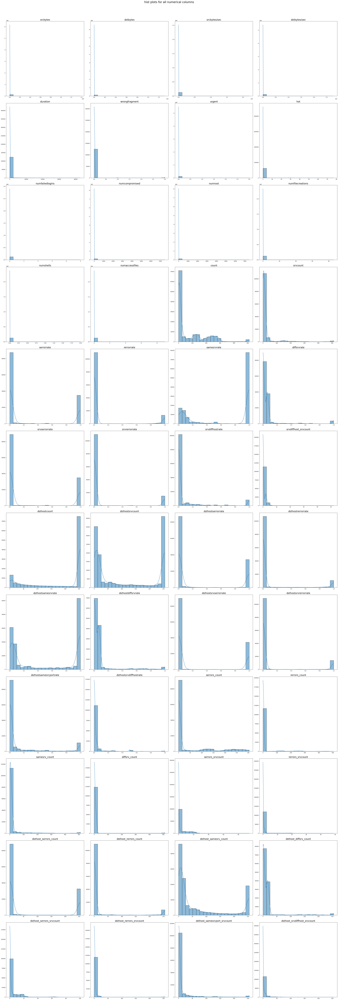

In [22]:
import math
import warnings
num_cols = 4 #number of columns
fig = plt.figure(figsize = (num_cols*10,len(cont_cols)*10/num_cols))
plt.suptitle("hist plots for all numerical columns\n",fontsize=24)
k = 1
for i in cont_cols:
    plt.subplot(math.ceil(len(cont_cols)/num_cols),num_cols,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.histplot(data=df_add,x = i,kde = True,bins = 20)
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean
    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

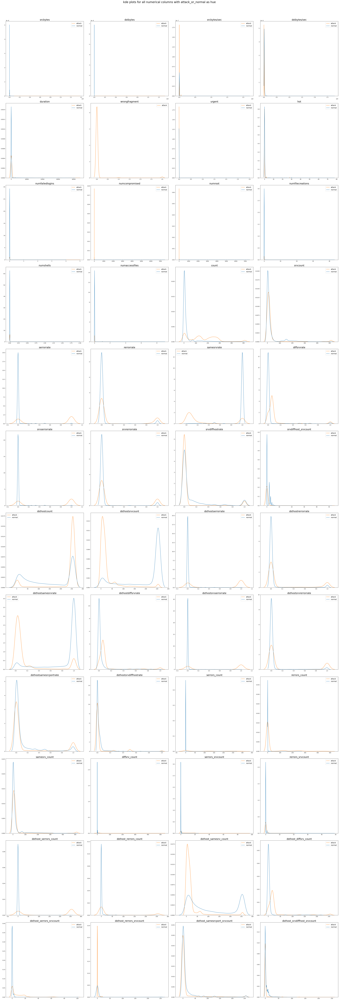

In [23]:
num_cols = 4
fig = plt.figure(figsize = (num_cols*10,len(cont_cols)*10/num_cols))
plt.suptitle("kde plots for all numerical columns with attack_or_normal as hue\n",fontsize=24)
k = 1
for i in cont_cols:
    plt.subplot(math.ceil(len(cont_cols)/num_cols),num_cols,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.kdeplot(data=df_add,x = i,hue = "attack_or_normal")
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean
    plt.legend(plot.get_legend_handles_labels,labels = ["attack","normal"],fontsize = 14, title_fontsize = 16)
    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

### Count Plots for Categorical Columns

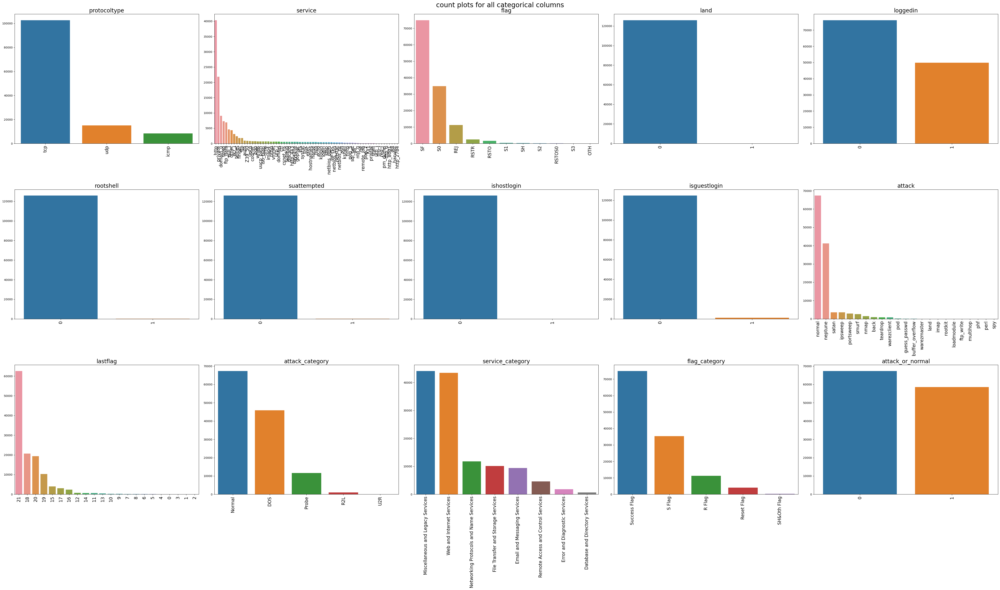

In [24]:
num_cols = 5
fig = plt.figure(figsize = (num_cols*10,len(cat_cols)*10/num_cols))
plt.suptitle("count plots for all categorical columns\n",fontsize=24)
k = 1
for i in cat_cols:
    plt.subplot(math.ceil(len(cat_cols)/num_cols),num_cols,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    category_order = df_add[i].value_counts().index
    plot = sns.countplot(data=df_add,x = i,order=category_order)
    plt.xticks(rotation = 90,fontsize = 16)
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean
    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

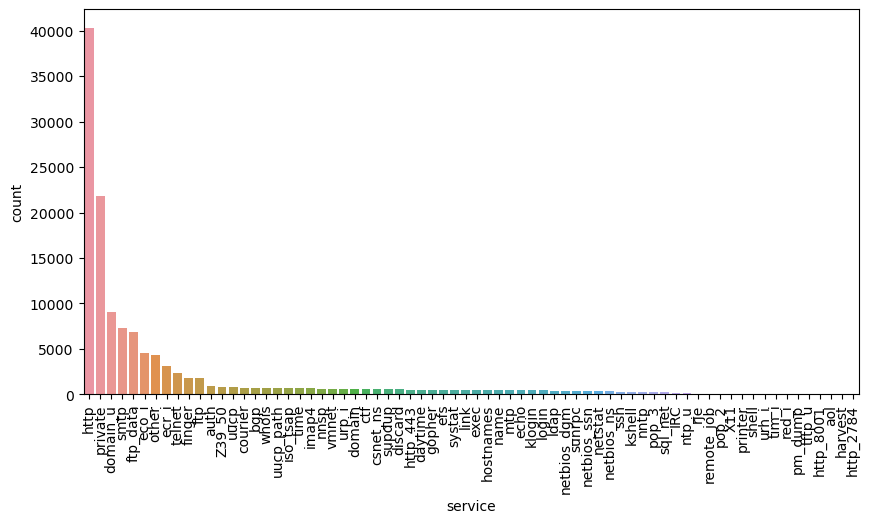

In [25]:
fig = plt.figure(figsize=(10,5))
category_order = df_add["service"].value_counts().index
sns.countplot(data=df_add,x = "service",order=category_order)
plt.xticks(rotation = 90,fontsize = 10)
plt.show()

**Observation**
> `tcp` dominates in protocoltype

> `http` and `private` dominates in service

> `SF` dominates in flag

> `neptune` dominates in attack types

> `u2r`,`r2l` has very less number of rows. Highly imbalanced in case of 5 class classification

> `Miscellaneous and Legacy Services` & `Web& Internet services` dominates in service_category

> `attack_or_normal` has better balanced dataset. So Binary classification may work better than 5 class multi class classification. 

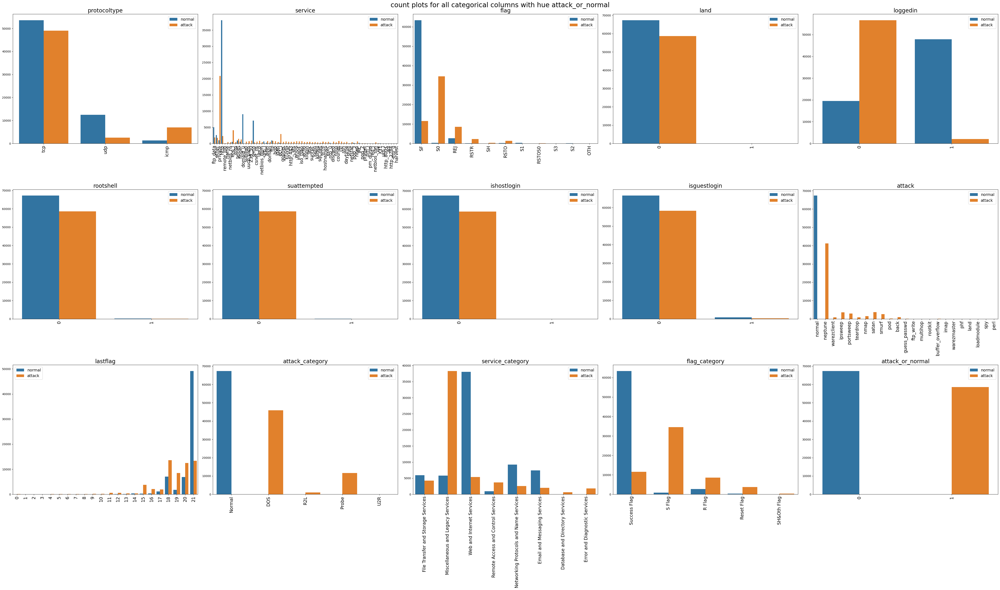

In [26]:
num_cols = 5
fig = plt.figure(figsize = (num_cols*10,len(cat_cols)*10/num_cols))
plt.suptitle("count plots for all categorical columns with hue attack_or_normal\n",fontsize=24)
k = 1
for i in cat_cols:
    plt.subplot(math.ceil(len(cat_cols)/num_cols),num_cols,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.countplot(data=df_add,x = i,hue = "attack_or_normal")
    plt.legend(plot.get_legend_handles_labels,labels = ["normal","attack"],fontsize = 14, title_fontsize = 16)
    plt.xticks(rotation = 90,fontsize = 16)
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean
    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

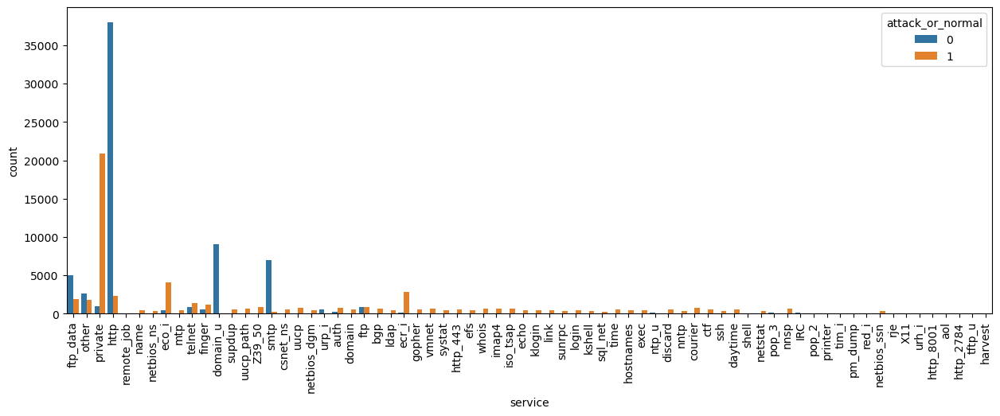

In [27]:
fig = plt.figure(figsize=(15,5))
sns.countplot(data=df_add,x = "service",hue="attack_or_normal")
plt.xticks(rotation = 90,fontsize = 10)
plt.show()

**Observation**
> attack dominates normal in `icmp protocoltype`, `All Flags except SF`, `when no login in`, `private service type` and `Miscellaneous and legacy Services`

### Outlier Detection

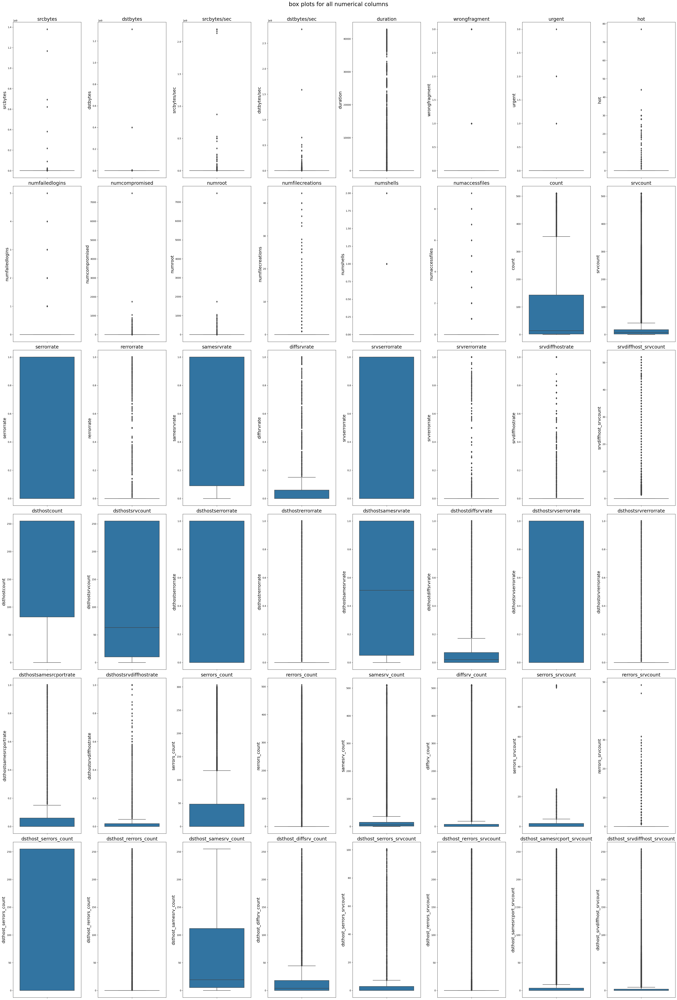

In [28]:
fig = plt.figure(figsize = (8*5,len(cont_cols)*5/(8/2)))
plt.suptitle("box plots for all numerical columns\n",fontsize=24)
k = 1
for i in cont_cols:
    plt.subplot(math.ceil(len(cont_cols)/8),8,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.boxplot(data=df_add,y = i)

    # Increase label and legend font sizes
    plot.set_xlabel(plot.get_xlabel(), fontsize=18)
    plot.set_ylabel(plot.get_ylabel(), fontsize=18)

    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

**Observation**
> May be because of lot of zeros in the distribution, Box plots are showing lot of outliers

> Lets remove the zeros and plot them again

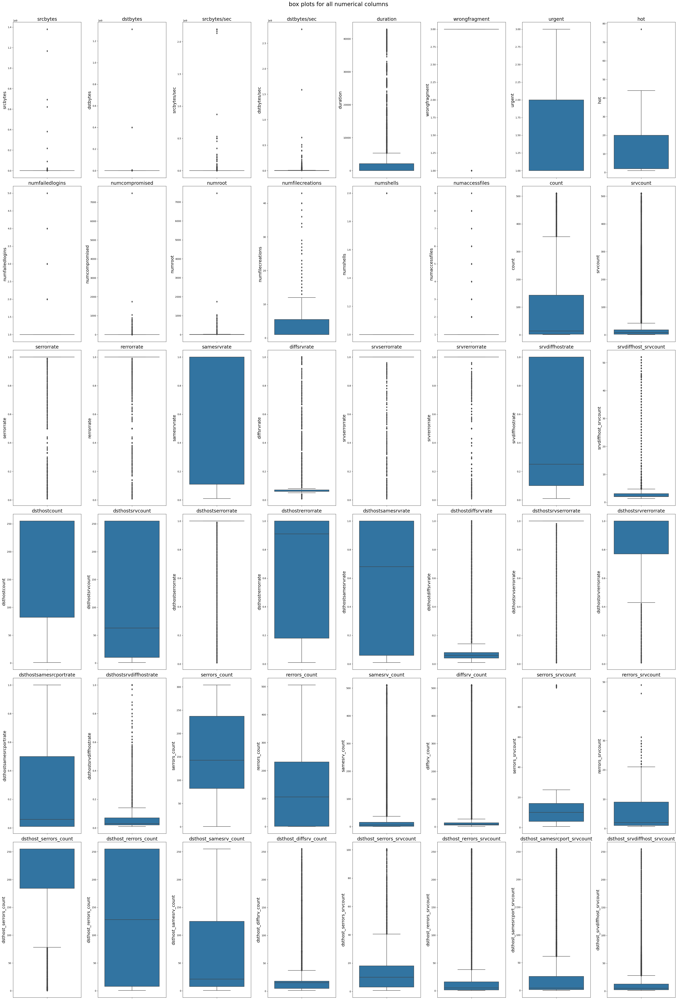

In [29]:
fig = plt.figure(figsize = (8*5,len(cont_cols)*5/(8/2)))
plt.suptitle("box plots for all numerical columns\n",fontsize=24)
k = 1
for i in cont_cols:
    plt.subplot(math.ceil(len(cont_cols)/8),8,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.boxplot(data=df_add[df_add[i] != 0],y = i)

    # Increase label and legend font sizes
    plot.set_xlabel(plot.get_xlabel(), fontsize=18)
    plot.set_ylabel(plot.get_ylabel(), fontsize=18)

    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

**Observation**
> Even after removing zeros, There are significant number of outliers.

### Boxcox transformation

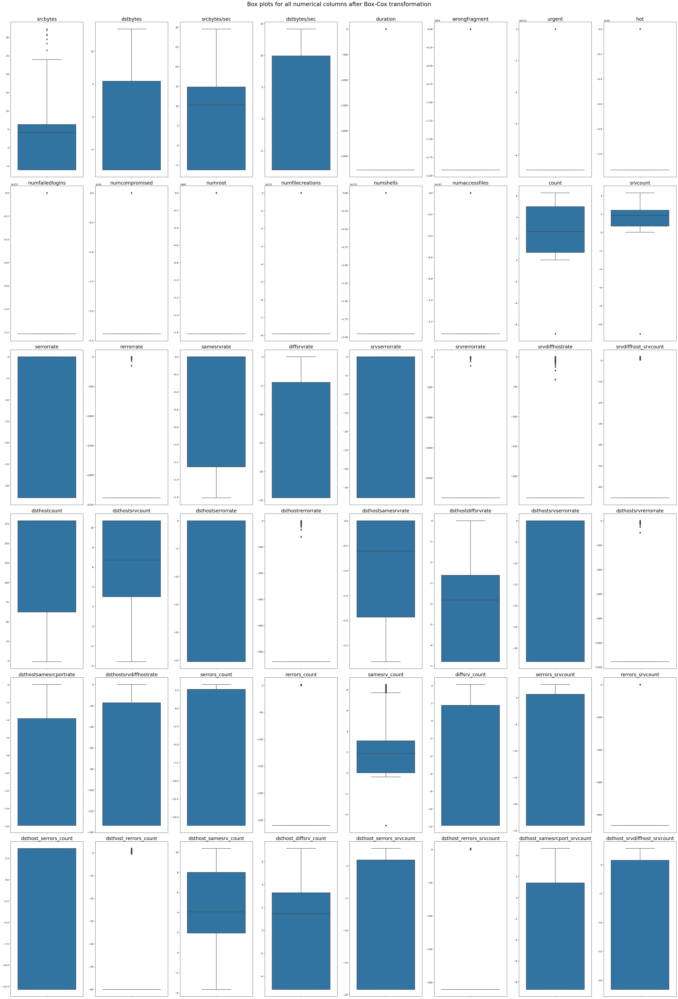

In [30]:
# Initialize transformed DataFrame and outlier count
df_boxcox = df_add.copy(deep=True)
outlier_counts = pd.Series(0, index=df_add.index)

# Set up the plot figure
fig = plt.figure(figsize=(8 * 5, len(cont_cols) * 5 / (8 / 2)))
plt.suptitle("Box plots for all numerical columns after Box-Cox transformation\n", fontsize=24)
k = 1

for col in cont_cols:
    # Apply Box-Cox transformation
    transformed_data, _ = stats.boxcox(df_add[col] + 0.001)  # Avoid zero by adding a small constant
    df_boxcox[col] = transformed_data  # Store transformed data in nadp_boxcox

    # Identify outliers using IQR
    Q1 = df_boxcox[col].quantile(0.25)
    Q3 = df_boxcox[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Flag outliers for this column
    is_outlier = (df_boxcox[col] < lower_bound) | (df_boxcox[col] > upper_bound)
    outlier_counts += is_outlier.astype(int)  # Increment outlier count for each row

    # Plotting
    plt.subplot(math.ceil(len(cont_cols) / 8), 8, k)
    plt.title(col, fontsize=20)
    k += 1
    
    # Create the boxplot of transformed data
    sns.boxplot(y=df_boxcox[col])
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean

# Add outlier count as a new feature
df_boxcox["number_of_features_identified_as_outlier"] = outlier_counts

# Finalize and display plot
warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

In [31]:
df_boxcox[df_boxcox["attack_or_normal"] == 0]["number_of_features_identified_as_outlier"].value_counts()

number_of_features_identified_as_outlier
0     31340
2     21609
1      4875
4      2603
3      2409
8      2178
6       905
10      718
5       350
9       206
7       122
11       24
12        4
Name: count, dtype: int64

In [32]:
df_boxcox[df_boxcox["attack_or_normal"] == 1]["number_of_features_identified_as_outlier"].value_counts()

number_of_features_identified_as_outlier
0     35870
8      8928
2      5275
9      3177
1      2925
3       903
6       611
10      353
5       247
4       236
12       43
7        35
11       27
Name: count, dtype: int64

<Axes: xlabel='number_of_features_identified_as_outlier', ylabel='Density'>

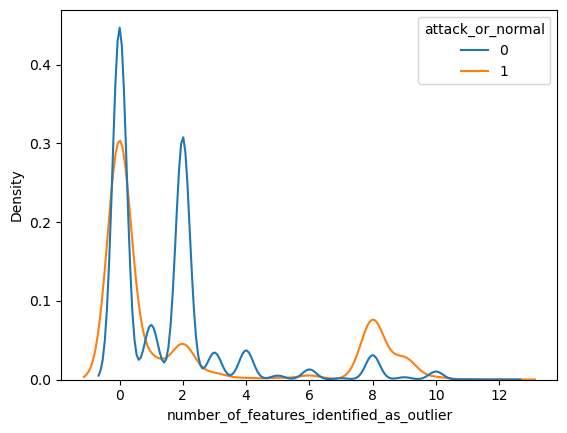

In [33]:
sns.kdeplot(data=df_boxcox,x = "number_of_features_identified_as_outlier",hue = "attack_or_normal")

**Observation**
> We can clearly identify that `Boxcox transformation helps to remove the significant number of outliers`.

> But it is `not advisable to remove the outliers. Because Outliers are identified as Anomalies`. 

> We have created `nadp_boxcox` dataframe to compare the results with & without boxcox transformation to get an understanding.

> `number_of_features_identified_as_outlier` is additional feature in nadp_boxcox. It represents how many features identified that particular row as outlier.

> If we observe top 5 value counts for attack vs normal, For normal --> "0 2 1 4 3", For Attack --> "0 8 2 1 9". It indicates that among the detected outliers (that means ignore 0), Attack category are identified more number of times than normal category. We can observe this kde plot at number 8 and 9 with high peak for attack category. 

### Bivariate Analysis

Cat vs Cat

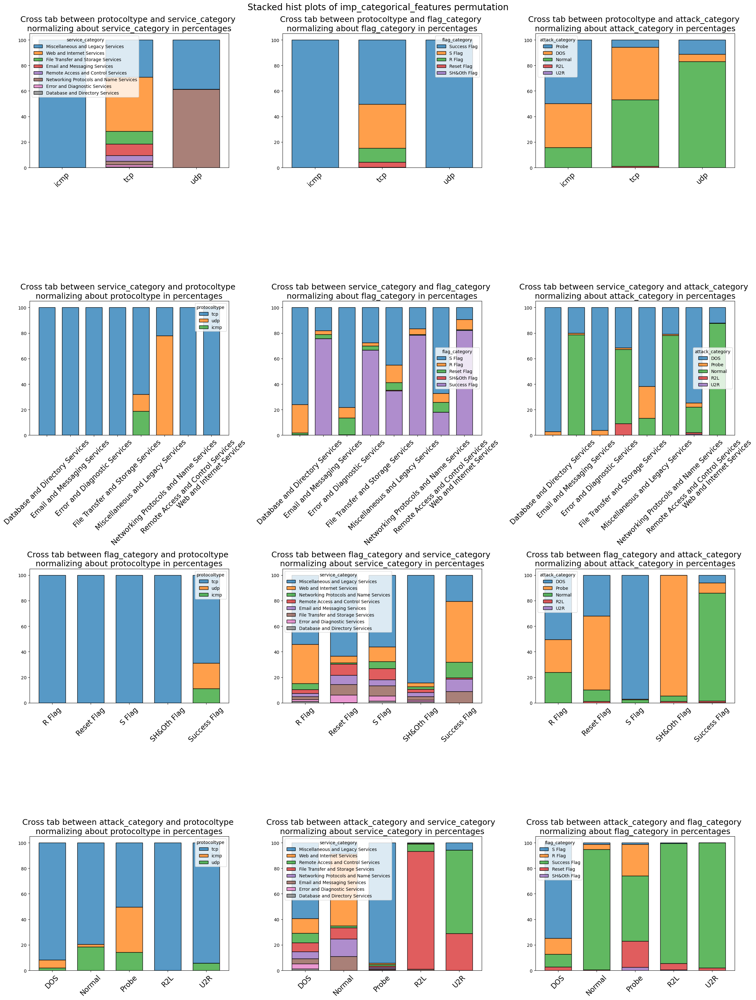

In [34]:
num_cols = 3
imp_cat_features = ['protocoltype', 'service_category', 'flag_category', 'attack_category']
cat_perm = list(permutations(imp_cat_features, 2))

fig = plt.figure(figsize=(num_cols * 8, len(cat_perm) * 8 / num_cols))
plt.suptitle("Stacked hist plots of imp_categorical_features permutation\n", fontsize=20)
k = 1

for p, q in cat_perm:
    plt.subplot(math.ceil(len(cat_perm) / num_cols), num_cols, k)
    plt.title(f"Cross tab between {p} and {q} \nnormalizing about {q} in percentages", fontsize=18)
    k += 1
    
    # Create the cross-tabulated data for plotting
    plot = df_add.groupby([p])[q].value_counts(normalize=True).mul(100).reset_index(name='percentage')
    
    # Plot the histogram with stacked bars and store the axis object
    ax = sns.histplot(x=p, hue=q, weights='percentage', multiple='stack', data=plot, shrink=0.7)
    
    # Set x-axis tick label font size
    plt.xticks(rotation=45, fontsize=16)
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean

    warnings.filterwarnings('ignore')

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()
warnings.filterwarnings('ignore')

**Observation**
> icmp has dominated by `Miscellaneous and Legacy Services" only. udp has only two types of services `Miscellaneous and Legacy Services` and `File Transfer and Storage Services`.

> icmp has totally `success flag` but it also has mostly `attacked'.

> Error Flag distribution is high in `Database and Directory Services, Error and Diagnostic services, Remote access and control services`. That means, System able to flag properly in these services.

> `Database and Directory Services, Error and Diagnostic services` has dominated by attack categories only.

> Unable to flag properly in `udp & icmp` protocoltype.

> S Flag has mostly `DOS` attack category. `SH&OTH` Flag has mostly `Probe` attack category.

> `R2L` uses only `tcp` protocol    

### Numerical vs Categorical

In [35]:
imp_cat_features = ['protocoltype', 'service_category', 'flag_category', 'attack_category']
imp_cont_features = ['duration', 'srcbytes','dstbytes','wrongfragment','urgent','hot','numfailedlogins',
                     'numcompromised','numroot','numfilecreations','numshells','numaccessfiles']
Cat_Vs_cont = []
for i in range(len(imp_cat_features)):
    for j in range(len(imp_cont_features)):
        if (df_add[imp_cat_features[i]].nunique()<50):
            Cat_Vs_cont.append((imp_cat_features[i], imp_cont_features[j]))
print(Cat_Vs_cont)
print(len(Cat_Vs_cont))

[('protocoltype', 'duration'), ('protocoltype', 'srcbytes'), ('protocoltype', 'dstbytes'), ('protocoltype', 'wrongfragment'), ('protocoltype', 'urgent'), ('protocoltype', 'hot'), ('protocoltype', 'numfailedlogins'), ('protocoltype', 'numcompromised'), ('protocoltype', 'numroot'), ('protocoltype', 'numfilecreations'), ('protocoltype', 'numshells'), ('protocoltype', 'numaccessfiles'), ('service_category', 'duration'), ('service_category', 'srcbytes'), ('service_category', 'dstbytes'), ('service_category', 'wrongfragment'), ('service_category', 'urgent'), ('service_category', 'hot'), ('service_category', 'numfailedlogins'), ('service_category', 'numcompromised'), ('service_category', 'numroot'), ('service_category', 'numfilecreations'), ('service_category', 'numshells'), ('service_category', 'numaccessfiles'), ('flag_category', 'duration'), ('flag_category', 'srcbytes'), ('flag_category', 'dstbytes'), ('flag_category', 'wrongfragment'), ('flag_category', 'urgent'), ('flag_category', 'hot'

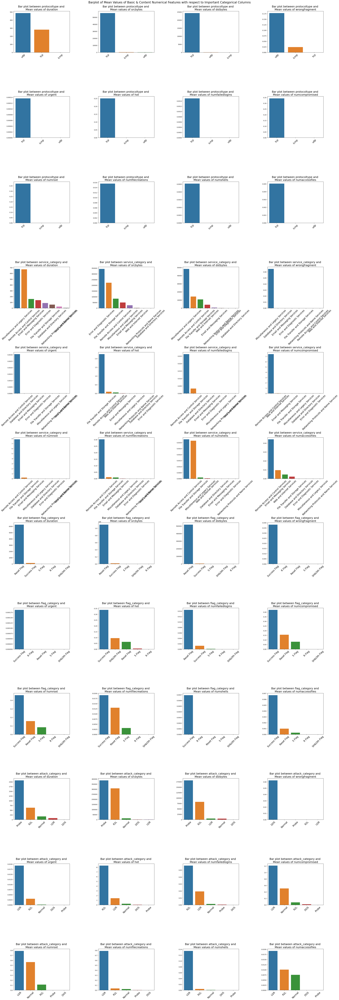

In [36]:
num_cols = 4
fig = plt.figure(figsize=(num_cols * 8, len(Cat_Vs_cont) * 8 / num_cols))
plt.suptitle("Barplot of Mean Values of Basic & Content Numerical Features with respect to Important Categorical Columns\n", fontsize=20)
k = 1

for p, q in Cat_Vs_cont:
    plt.subplot(math.ceil(len(Cat_Vs_cont) / num_cols), num_cols, k)
    plt.title(f"Bar plot between {p} and \nMean values of {q}", fontsize=18)
    k += 1
    
    # Plot the histogram with stacked bars and store the axis object
    df = pd.DataFrame(df_add.groupby([p])[[q]].mean().reset_index())
    sns.barplot(data = df,x = p,y= q,order = df.sort_values(q,ascending = False)[p])
    
    # Set x-axis tick label font size
    plt.xticks(rotation=45, fontsize=16)
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean

    warnings.filterwarnings('ignore')

plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()
warnings.filterwarnings('ignore')

### Time Series and Host related features

In [37]:
imp_cat_features = ['protocoltype', 'service_category', 'flag_category', 'attack_category']
imp_cont_features2 =    ['dsthostcount', 'dsthost_serrors_count','dsthost_rerrors_count', 'dsthost_samesrv_count','dsthost_diffsrv_count',
                         'dsthostsrvcount','dsthost_serrors_srvcount','dsthost_rerrors_srvcount', 'dsthost_samesrcport_srvcount','dsthost_srvdiffhost_srvcount',
                        'count', 'serrors_count', 'rerrors_count', 'samesrv_count','diffsrv_count',
                        'srvcount','serrors_srvcount', 'rerrors_srvcount','srvdiffhost_srvcount']
Cat_Vs_cont2 = []
for i in range(len(imp_cat_features)):
    for j in range(len(imp_cont_features2)):
        if (df_add[imp_cat_features[i]].nunique()<50):
            Cat_Vs_cont2.append((imp_cat_features[i], imp_cont_features2[j]))
print(Cat_Vs_cont2)
print(len(Cat_Vs_cont2))

[('protocoltype', 'dsthostcount'), ('protocoltype', 'dsthost_serrors_count'), ('protocoltype', 'dsthost_rerrors_count'), ('protocoltype', 'dsthost_samesrv_count'), ('protocoltype', 'dsthost_diffsrv_count'), ('protocoltype', 'dsthostsrvcount'), ('protocoltype', 'dsthost_serrors_srvcount'), ('protocoltype', 'dsthost_rerrors_srvcount'), ('protocoltype', 'dsthost_samesrcport_srvcount'), ('protocoltype', 'dsthost_srvdiffhost_srvcount'), ('protocoltype', 'count'), ('protocoltype', 'serrors_count'), ('protocoltype', 'rerrors_count'), ('protocoltype', 'samesrv_count'), ('protocoltype', 'diffsrv_count'), ('protocoltype', 'srvcount'), ('protocoltype', 'serrors_srvcount'), ('protocoltype', 'rerrors_srvcount'), ('protocoltype', 'srvdiffhost_srvcount'), ('service_category', 'dsthostcount'), ('service_category', 'dsthost_serrors_count'), ('service_category', 'dsthost_rerrors_count'), ('service_category', 'dsthost_samesrv_count'), ('service_category', 'dsthost_diffsrv_count'), ('service_category', 'd

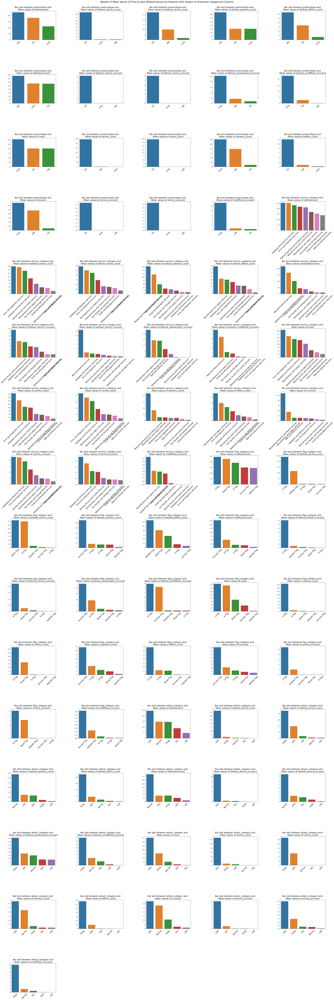

In [38]:
num_cols = 5
fig = plt.figure(figsize=(num_cols * 8, len(Cat_Vs_cont2) * 8 / num_cols))
plt.suptitle("Barplot of Mean Values of Time & Host Related Numerical Features with respect to Important Categorical Columns\n", fontsize=20)
k = 1

for p, q in Cat_Vs_cont2:
    plt.subplot(math.ceil(len(Cat_Vs_cont2) / num_cols), num_cols, k)
    plt.title(f"Bar plot between {p} and \nMean values of {q}", fontsize=18)
    k += 1
    
    # Plot the histogram with stacked bars and store the axis object
    df_n = pd.DataFrame(df_add.groupby([p])[[q]].mean().reset_index())
    sns.barplot(data = df_n,x = p,y= q,order = df_n.sort_values(q,ascending = False)[p])
    
    # Set x-axis tick label font size
    plt.xticks(rotation=45, fontsize=16)
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean

    warnings.filterwarnings('ignore')

plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()
warnings.filterwarnings('ignore')

**Observation**
> `udp` dominates in `dsthostcount & dsthostsrvcount` and `dsthost_samesrv_count, dsthost_diffsrv_count` . `icmp` dominates in `count & srcount` and `dsthost_samesrcport_srvcount, dsthost_srvdiffhost_srvcount,samesrvcount,srvdiffhost_srvcount`. `tcp` dominates in `all types of serrors and rerrors`and `diffsrvcount`.

> `Database and Directory Service` dominates in `dsthostcount, dsthost_rerrors_count, serrors_srvcount, rerrors_srvcount`. `Error and Diagnostic Services` dominates in `dsthost_serrors_count, count, serros_count, rerrors_count`. `Networking Protocal & Name services` dominates in `dsthost_samesrv_count, samesrv_count, srvcount`. `Miscellaneous and Legacy Services` dominates in `dsthost_diffsrv_count, dsthost_samesrcport_srvcount, diffsrv_count, srvdiffhost_srvcount`. `Web and Internet services` dominates in `dsthostsrvcount, dsthost_rerrors_srvcount, dsthost_srvdiffhost_srvcount`.

> `S Flag` dominates in `dsthostcount, dsthost_serrors_count, dsthost_serrors_srvcount,count, serrors_count, serrors_srvcount`. `Reset Flag` dominates in `dsthost_rerrors_count`. `R Flag` dominates in ` dsthost_rerrors_srvcount, dsthost_srvdiffhost_srvcount, rerrors_count, diffsrv_count, rerrors_srvcount`. `SH&Oth Flag` dominates in `dsthost_diffsrv_count`. `Success Flag` dominates in remaining features.

> `DOS` attack type dominates in `dsthostcount, dsthost_serrors_count, dsthost_serrors_srvcount, count, serrors_count, samesrv_count, srvcount, serrors_srvcount, rerrors_srvcount`. `Probe` dominates in ` dsthost_rerrors_count, dsthost_diffsrv_count, dsthost_samesrcport_srvcount, dsthost_srvdiffhost_srvcount, rerrors_count, diffsrv_count`. `Normal Flag` dominates in remaining features. 

## Correlation and Heat Maps

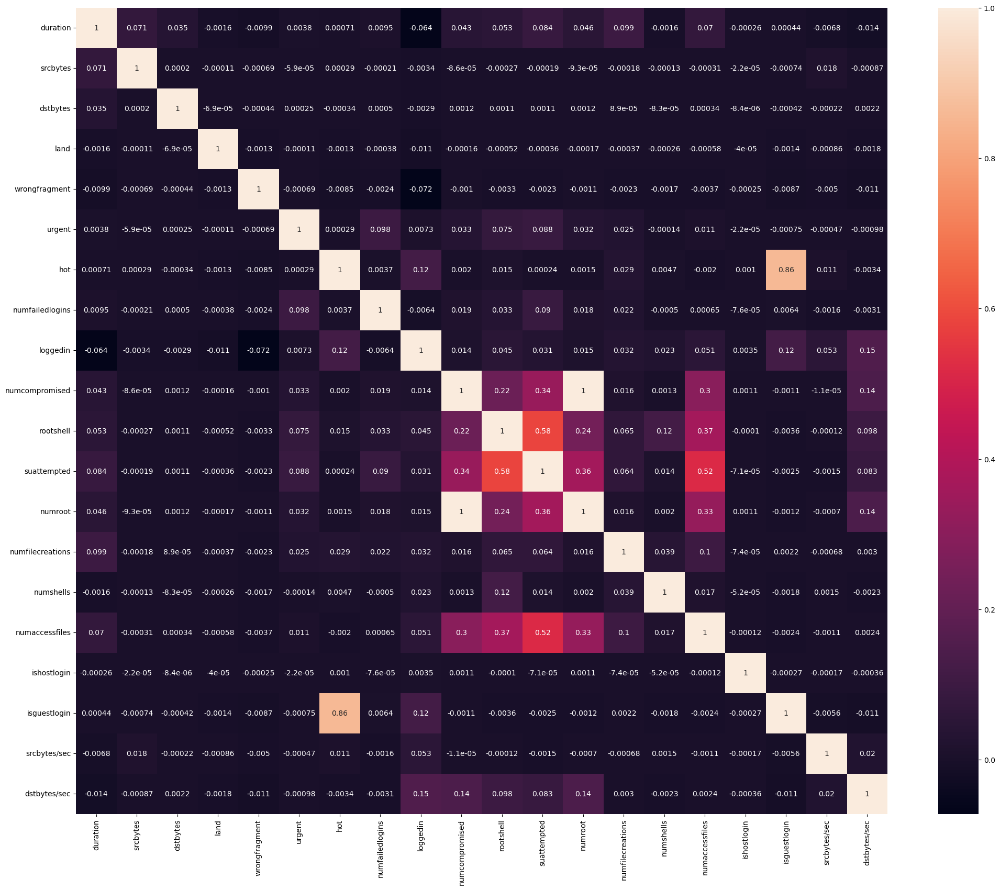

In [39]:
cols = ['duration', 'protocoltype', 'service', 'flag', 'srcbytes', 'dstbytes',
       'land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin',
       'numcompromised', 'rootshell', 'suattempted', 'numroot',
       'numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin',
       'isguestlogin','srcbytes/sec', 'dstbytes/sec']

corr = df_add[cols].corr(numeric_only=True)
plt.figure(figsize=(25,20))
sns.heatmap(corr,annot=True)
plt.show()


#### Time and Host Related Features Correlation

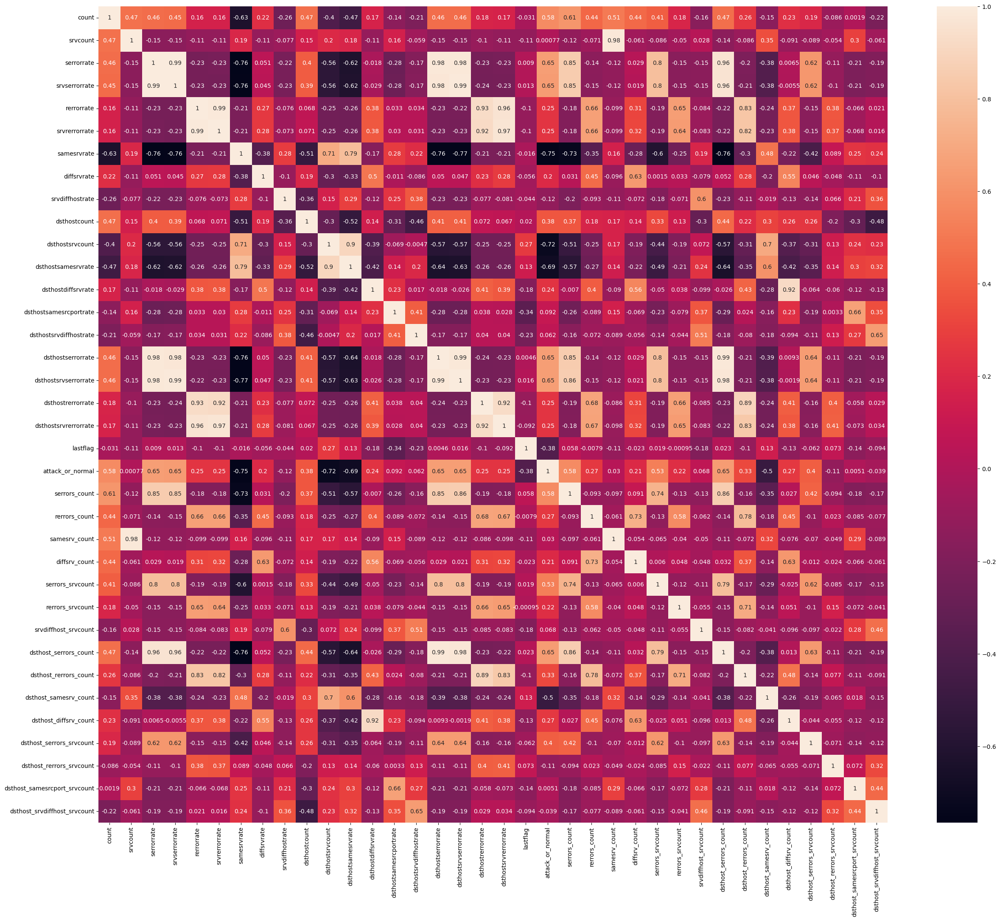

In [40]:
cols = ['count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'attack', 'lastflag',
       'attack_category', 'service_category', 'flag_category',
       'attack_or_normal', 'serrors_count', 'rerrors_count', 'samesrv_count',
       'diffsrv_count', 'serrors_srvcount', 'rerrors_srvcount',
       'srvdiffhost_srvcount', 'dsthost_serrors_count',
       'dsthost_rerrors_count', 'dsthost_samesrv_count',
       'dsthost_diffsrv_count', 'dsthost_serrors_srvcount',
       'dsthost_rerrors_srvcount', 'dsthost_samesrcport_srvcount',
       'dsthost_srvdiffhost_srvcount']

corr = df_add[cols].corr(numeric_only=True)
plt.figure(figsize=(30,25))
sns.heatmap(corr,annot=True)
plt.show()

**Observation**
> Positive correlation > 0.9 is observed between 
1. srvserrorrate and serrorrate correlation: 0.99
2. srvrerrorrate and rerrorrate correlation: 0.99
3. dsthostserrorrate and serrorrate correlation: 0.98
4. dsthostserrorrate and srvserrorrate correlation: 0.98
5. dsthostsrvserrorrate and serrorrate correlation: 0.98
6. dsthostsrvserrorrate and srvserrorrate correlation: 0.99
7. dsthostsrvserrorrate and dsthostserrorrate correlation: 0.99
8. dsthostrerrorrate and rerrorrate correlation: 0.93
9. dsthostrerrorrate and srvrerrorrate correlation: 0.92
10. dsthostsrvrerrorrate and rerrorrate correlation: 0.96
11. dsthostsrvrerrorrate and srvrerrorrate correlation: 0.97
12. dsthostsrvrerrorrate and dsthostrerrorrate correlation: 0.92
13. samesrv_count and srvcount correlation: 0.98
14. dsthost_serrors_count and serrorrate correlation: 0.96
15. dsthost_serrors_count and srvserrorrate correlation: 0.96
16. dsthost_serrors_count and dsthostserrorrate correlation: 0.99
17. dsthost_serrors_count and dsthostsrvserrorrate correlation: 0.98
18. dsthost_diffsrv_count and dsthostdiffsrvrate correlation: 0.92`

> Negative correlation < -0.7 is observed between
1. Samesrvrate and serrorrate correlation: -0.76
2. samesrvrate and srvserrorrate correlation: -0.76
3. dsthostserrorrate and samesrvrate correlation: -0.76
4. dsthostsrvserrorrate and samesrvrate correlation: -0.77
5. attack_or_normal and samesrvrate correlation: -0.75
6. attack_or_normal and dsthostsrvcount correlation: -0.72
7. serrors_count and samesrvrate correlation: -0.73
8. dsthost_serrors_count and samesrvrate correlation: -0.76

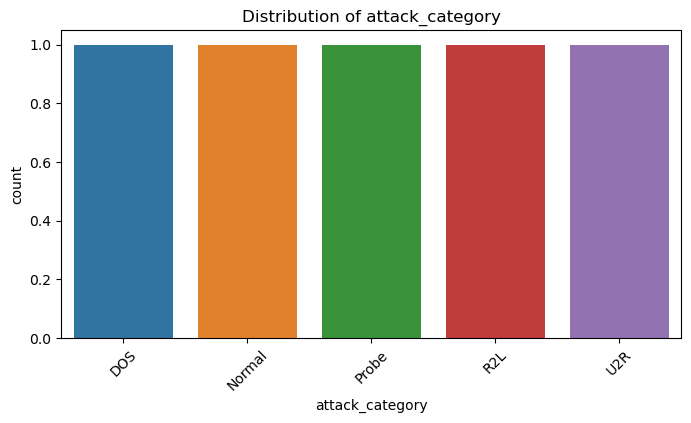

In [41]:
#categoprical features distribution
categorical_features = df.select_dtypes(include=['object', 'category']).columns

for feature in categorical_features:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=df, x=feature, order=df[feature].value_counts().index)
    plt.title(f'Distribution of {feature}')
    plt.xticks(rotation=45)
    plt.show()

**Inference : We clearly see that our Target column attack is Imbalanced data. We can balance it using balancing techqiues such as SMOTE, or here since our goal is to identify an Anomlay case, we can alias an Attack as 1 and Normal as 0 and call it attack binary.**

### Correlation Matrix

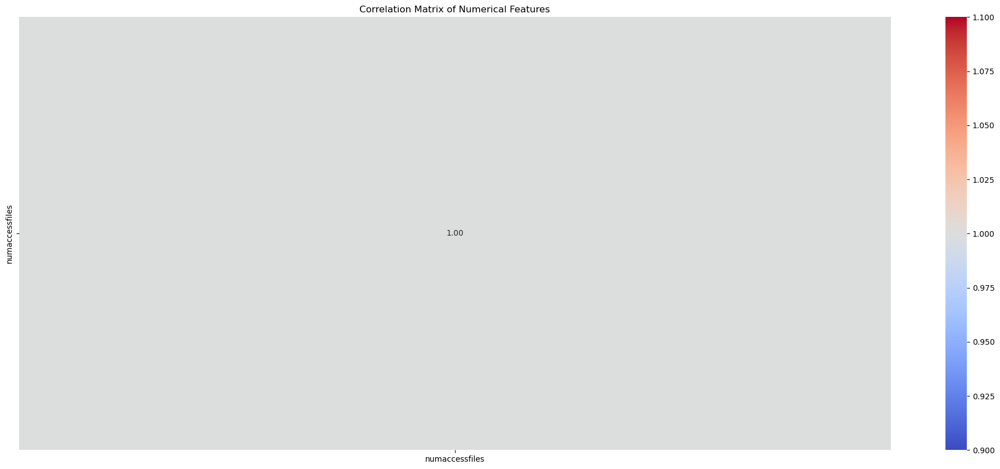

In [42]:
numerical_df = df.select_dtypes(include=['int64', 'float64'])

# Calculate correlation matrix
corr_matrix = numerical_df.corr()

# Plot the heatmap of the correlation matrix
plt.figure(figsize=(25, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix of Numerical Features")
plt.show()

**We can see some features are highly correlated with Attack Binary.**
- Loggedin is negatively correlated suggesting the network which were not logged in had higher chances of being an anomaly.


**We can clerly see the number of outliers increases when there is attack specifically for SRCBYTES column.**

### Check the distribution of various features when Attack=1

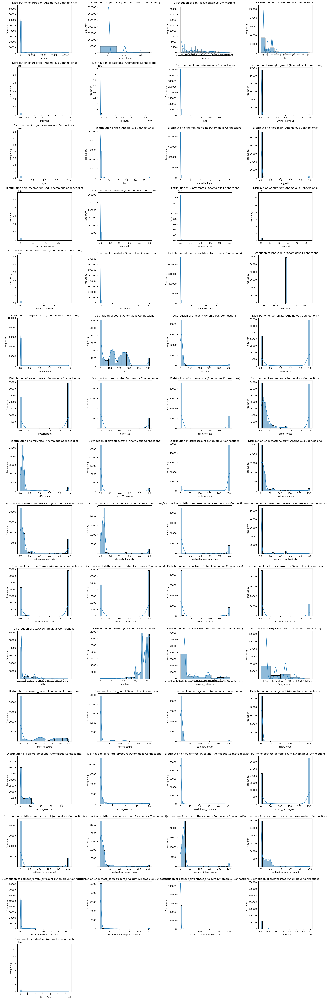

In [43]:
# Set up the plot grid
feature_columns = df_add.drop(columns=['attack_category', 'attack_or_normal']).columns
num_features = len(feature_columns)
num_cols = 4  # Number of columns in the plot grid
num_rows = (num_features // num_cols) + 1
anomalous_data = df_add[df_add['attack_or_normal'] == 1]
plt.figure(figsize=(20, num_rows * 4))
for i, feature in enumerate(feature_columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.histplot(anomalous_data[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature} (Anomalous Connections)')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Hypothesis Testing

In [44]:
df_add.columns

Index(['duration', 'protocoltype', 'service', 'flag', 'srcbytes', 'dstbytes',
       'land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin',
       'numcompromised', 'rootshell', 'suattempted', 'numroot',
       'numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin',
       'isguestlogin', 'count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'attack', 'lastflag',
       'attack_category', 'service_category', 'flag_category',
       'attack_or_normal', 'serrors_count', 'rerrors_count', 'samesrv_count',
       'diffsrv_count', 'serrors_srvcount', 'rerrors_srvcount',
       'srvdiffhost_srvcount', 'dsthost_serrors_count',
       'dst

**1) Dstbytes and Srcbytes Speed vs Attack Binary**}

In [45]:
from scipy.stats import ttest_ind

# Separate srcbytes/sec and dstbytes/sec for normal and attack connections
srcbytes_sec_normal = df_add[df_add['attack_or_normal'] == 0]['srcbytes/sec']
srcbytes_sec_attack = df_add[df_add['attack_or_normal'] == 1]['srcbytes/sec']
dstbytes_sec_normal = df_add[df_add['attack_or_normal'] == 0]['dstbytes/sec']
dstbytes_sec_attack = df_add[df_add['attack_or_normal'] == 1]['dstbytes/sec']

# Perform t-tests for srcbytes/sec and dstbytes/sec between normal and attack
srcbytes_sec_ttest = ttest_ind(srcbytes_sec_normal, srcbytes_sec_attack, equal_var=False)
dstbytes_sec_ttest = ttest_ind(dstbytes_sec_normal, dstbytes_sec_attack, equal_var=False)

# Print the results
print("T-test results for srcbytes/sec:")
print(f"Statistic: {srcbytes_sec_ttest.statistic:.4f}, p-value: {srcbytes_sec_ttest.pvalue:.4f}")

print("\nT-test results for dstbytes/sec:")
print(f"Statistic: {dstbytes_sec_ttest.statistic:.4f}, p-value: {dstbytes_sec_ttest.pvalue:.4f}")

# Interpretation
alpha = 0.05  # Significance level
if srcbytes_sec_ttest.pvalue < alpha:
    print("\nConclusion: There is a significant difference in 'srcbytes/sec' between normal and attack connections.")
else:
    print("\nConclusion: There is no significant difference in 'srcbytes/sec' between normal and attack connections.")

if dstbytes_sec_ttest.pvalue < alpha:
    print("Conclusion: There is a significant difference in 'dstbytes/sec' between normal and attack connections.")
else:
    print("Conclusion: There is no significant difference in 'dstbytes/sec' between normal and attack connections.")


T-test results for srcbytes/sec:
Statistic: 7.2770, p-value: 0.0000

T-test results for dstbytes/sec:
Statistic: 39.8207, p-value: 0.0000

Conclusion: There is a significant difference in 'srcbytes/sec' between normal and attack connections.
Conclusion: There is a significant difference in 'dstbytes/sec' between normal and attack connections.


**Inference : p < 0.05 and data transfer rate does have significant impact on Attack

**2) Protocoltype vs Attack Binary**

In [46]:
import scipy.stats as stats
import pandas as pd

# Create a contingency table for protocoltype and attack_or_not
contingency_table = pd.crosstab(df_add['protocoltype'], df_add['attack_or_normal'])

# Display the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform Chi-square test
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

# Print the results
print(f"\nChi-square Test Results:")
print(f"Chi-square Statistic: {chi2:.2f}")
print(f"P-value: {p:.4f}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies Table:")
print(expected)

# Interpretation
alpha = 0.05  # Significance level
if p < alpha:
    print("\nConclusion: There is a significant association between protocoltype and anomaly detection (attack_or_not).")
else:
    print("\nConclusion: There is no significant association between protocoltype and anomaly detection (attack_or_not).")


Contingency Table:
attack_or_normal      0      1
protocoltype                  
icmp               1309   6982
tcp               53600  49089
udp               12434   2559

Chi-square Test Results:
Chi-square Statistic: 10029.25
P-value: 0.0000
Degrees of Freedom: 2
Expected Frequencies Table:
[[ 4432.22605638  3858.77394362]
 [54895.77391187 47793.22608813]
 [ 8015.00003175  6977.99996825]]

Conclusion: There is a significant association between protocoltype and anomaly detection (attack_or_not).


**3) Hypothesis : Service do not have any impact on attack**

In [47]:
import scipy.stats as stats
import pandas as pd

# Create a contingency table for service and attack_or_normal
contingency_table = pd.crosstab(df_add['service'], df_add['attack_or_normal'])

# Display the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform Chi-square test
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

# Print the results
print(f"\nChi-square Test Results:")
print(f"Chi-square Statistic: {chi2:.2f}")
print(f"P-value: {p:.4f}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies Table:")
print(expected)

# Interpretation
alpha = 0.05  # Significance level
if p < alpha:
    print("\nConclusion: There is a significant association between service and anomaly detection (attack_or_normal).")
else:
    print("\nConclusion: There is no significant association between service and anomaly detection (attack_or_normal).")


Contingency Table:
attack_or_normal    0    1
service                   
IRC               186    1
X11                67    6
Z39_50              0  862
aol                 0    2
auth              236  719
...               ...  ...
urp_i             599    3
uucp                0  780
uucp_path           0  689
vmnet               0  617
whois               0  693

[70 rows x 2 columns]

Chi-square Test Results:
Chi-square Statistic: 93240.03
P-value: 0.0000
Degrees of Freedom: 69
Expected Frequencies Table:
[[9.99669850e+01 8.70330150e+01]
 [3.90245449e+01 3.39754551e+01]
 [4.60810380e+02 4.01189620e+02]
 [1.06916561e+00 9.30834385e-01]
 [5.10526581e+02 4.44473419e+02]
 [3.79553793e+02 3.30446207e+02]
 [3.92383781e+02 3.41616219e+02]
 [2.91347630e+02 2.53652370e+02]
 [3.00970121e+02 2.62029879e+02]
 [2.78517643e+02 2.42482357e+02]
 [2.87605550e+02 2.50394450e+02]
 [3.04177617e+02 2.64822383e+02]
 [4.83423233e+03 4.20876767e+03]
 [2.32008938e+02 2.01991062e+02]
 [2.45159675e+03 2.13

**4) Flag vs Attack Binary**

In [48]:
df_add['flag'].unique()

array(['SF', 'S0', 'REJ', 'RSTR', 'SH', 'RSTO', 'S1', 'RSTOS0', 'S3',
       'S2', 'OTH'], dtype=object)

In [49]:
import statsmodels.api as sm
import pandas as pd

# Create dummy variables for 'flag' and drop the first category to avoid multicollinearity
X = pd.get_dummies(df_add['flag'], prefix='flag', drop_first=True).astype(float)

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Set the target variable
y = df_add['attack_or_normal']

# Fit the logistic regression model
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# Print the summary of the logistic regression
print(result.summary())

# Interpretation of the results
alpha = 0.05  # Significance level
print("\nInference:")

# Check if any flag categories are significantly associated with anomalies
significant_flags = result.pvalues[result.pvalues < alpha].index
if len(significant_flags) > 0:
    print("The following flag categories are significantly associated with anomalies (p-value < 0.05):")
    for flag in significant_flags:
        coef = result.params[flag]
        relationship = "increases" if coef > 0 else "decreases"
        print(f"  - {flag} (Coefficient: {coef:.2f}) {relationship} the likelihood of an anomaly.")
else:
    print("No flag categories are significantly associated with anomalies at the 0.05 significance level.")


         Current function value: 0.330741
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:       attack_or_normal   No. Observations:               125973
Model:                          Logit   Df Residuals:                   125962
Method:                           MLE   Df Model:                           10
Date:                Thu, 21 Nov 2024   Pseudo R-squ.:                  0.5212
Time:                        08:34:18   Log-Likelihood:                -41664.
converged:                      False   LL-Null:                       -87016.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.1575      0.346      3.349      0.001       0.480       1.835
flag_REJ       -0.0034      0.346     -0.010      0.992      -

**We can see that when the Flag value is between 4 and 6 (visualizations), and the p-value here is less than 0.05, hence there is a significant correlation between flag and attack binary**

**5) urgent vs attack binary**

In [50]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

# Select 'urgent' as the predictor and 'attack_or_normal' as the target
X = df_add[['urgent']]
y = df_add['attack_or_normal']

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Fit the logistic regression model
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# Print the summary of the logistic regression
print(result.summary())


Optimization terminated successfully.
         Current function value: 0.690749
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       attack_or_normal   No. Observations:               125973
Model:                          Logit   Df Residuals:                   125971
Method:                           MLE   Df Model:                            1
Date:                Thu, 21 Nov 2024   Pseudo R-squ.:               5.941e-06
Time:                        08:34:19   Log-Likelihood:                -87016.
converged:                       True   LL-Null:                       -87016.
Covariance Type:            nonrobust   LLR p-value:                    0.3092
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1385      0.006    -24.521      0.000      -0.150      -0.127
urgent        -0.4307      0.

**We can see that when the Urgent value has no significant correlation from the Visualizations, and the p-value here is greater than 0.05, hence there is NO significant correlation between Urgent and attack binary**|

### Modelling

#### Standard Preprocessing

In [51]:
df_add.columns
#df_add['suattempted'].unique()

Index(['duration', 'protocoltype', 'service', 'flag', 'srcbytes', 'dstbytes',
       'land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin',
       'numcompromised', 'rootshell', 'suattempted', 'numroot',
       'numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin',
       'isguestlogin', 'count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'attack', 'lastflag',
       'attack_category', 'service_category', 'flag_category',
       'attack_or_normal', 'serrors_count', 'rerrors_count', 'samesrv_count',
       'diffsrv_count', 'serrors_srvcount', 'rerrors_srvcount',
       'srvdiffhost_srvcount', 'dsthost_serrors_count',
       'dst

In [52]:
# Define categorical and numerical columns
categorical_cols = ['protocoltype', 'service', 'flag', 'lastflag','suattempted']  # Adjust based on your dataset
numerical_cols = ['duration', 'srcbytes', 'dstbytes',
       'land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin',
       'numcompromised', 'rootshell', 'numroot',
       'numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin',
       'isguestlogin', 'count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'serrors_count', 'rerrors_count', 'samesrv_count',
       'diffsrv_count', 'serrors_srvcount', 'rerrors_srvcount',
       'srvdiffhost_srvcount', 'dsthost_serrors_count',
       'dsthost_rerrors_count', 'dsthost_samesrv_count',
       'dsthost_diffsrv_count', 'dsthost_serrors_srvcount',
       'dsthost_rerrors_srvcount', 'dsthost_samesrcport_srvcount',
       'dsthost_srvdiffhost_srvcount', 'srcbytes/sec', 'dstbytes/sec'] #removed service category, flag category



## Model 1: Binary Classification (Attack or Not)

In [69]:
df_bin=df_add.copy(deep=True)

In [70]:
import pickle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder

#### Decision Tree

In [71]:


# Assuming df_bin is your preprocessed dataset with 'attack_or_normal' as target column
# Replace df_bin with your actual DataFrame variable if needed

# Define categorical and numerical columns
categorical_cols = ['protocoltype', 'service', 'flag', 'lastflag','suattempted']  # Adjust based on your dataset
numerical_cols = ['duration', 'srcbytes', 'dstbytes',
       'land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin',
       'numcompromised', 'rootshell', 'numroot',
       'numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin',
       'isguestlogin', 'count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'serrors_count', 'rerrors_count', 'samesrv_count',
       'diffsrv_count', 'serrors_srvcount', 'rerrors_srvcount',
       'srvdiffhost_srvcount', 'dsthost_serrors_count',
       'dsthost_rerrors_count', 'dsthost_samesrv_count',
       'dsthost_diffsrv_count', 'dsthost_serrors_srvcount',
       'dsthost_rerrors_srvcount', 'dsthost_samesrcport_srvcount',
       'dsthost_srvdiffhost_srvcount', 'srcbytes/sec', 'dstbytes/sec'] #removed service category, flag category

# Encode categorical columns
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df_bin[col] = le.fit_transform(df_bin[col])
    label_encoders[col] = le

# Scale numerical columns
scaler = StandardScaler()
df_bin[numerical_cols] = scaler.fit_transform(df_bin[numerical_cols])

# Assuming df_bin is preprocessed and ready for model fitting
X = df_bin[categorical_cols + numerical_cols]
y = df_bin['attack_or_normal']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Initialize and train the Decision Tree Classifier
dt_binary = DecisionTreeClassifier(random_state=42)
dt_binary.fit(X_train, y_train)

# Make predictions
y_pred_binary = dt_binary.predict(X_test)

# Evaluate the model
print("Binary Classification (Attack or Not):")
print("Accuracy:", accuracy_score(y_test, y_pred_binary))
print(classification_report(y_test, y_pred_binary))

# Assuming you have a scaler and label_encoders already fit on the training data
# Save the scaler and label encoders used during training
with open('bin_scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

with open('bin_label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)

# Save the trained Decision Tree model
with open('binary_classification_dt_model.pkl', 'wb') as f:
    pickle.dump(dt_binary, f)


Binary Classification (Attack or Not):
Accuracy: 0.9992458821194682
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13469
           1       1.00      1.00      1.00     11726

    accuracy                           1.00     25195
   macro avg       1.00      1.00      1.00     25195
weighted avg       1.00      1.00      1.00     25195



We obserserve a very High accuracy and Cv score and this is a great Model


## Model 2: Multiclass Classification (Attack Type)

In [72]:
df_class=df_add.copy(deep=True)

In [73]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

# Assuming df_class is your preprocessed dataset
# Replace df_class with your actual DataFrame variable if needed

# Define categorical and numerical columns
categorical_cols = ['protocoltype', 'service', 'flag', 'lastflag','suattempted']  # Adjust based on your dataset
numerical_cols = ['duration', 'srcbytes', 'dstbytes',
       'land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin',
       'numcompromised', 'rootshell', 'numroot',
       'numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin',
       'isguestlogin', 'count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'serrors_count', 'rerrors_count', 'samesrv_count',
       'diffsrv_count', 'serrors_srvcount', 'rerrors_srvcount',
       'srvdiffhost_srvcount', 'dsthost_serrors_count',
       'dsthost_rerrors_count', 'dsthost_samesrv_count',
       'dsthost_diffsrv_count', 'dsthost_serrors_srvcount',
       'dsthost_rerrors_srvcount', 'dsthost_samesrcport_srvcount',
       'dsthost_srvdiffhost_srvcount', 'srcbytes/sec', 'dstbytes/sec'] #removed service category, flag category

# Define features and target
X = df_class[categorical_cols + numerical_cols]
y = df_class['attack_category']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encode categorical columns using LabelEncoder
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    X_test[col] = le.transform(X_test[col])  # Use the same encoder for the test set
    label_encoders[col] = le

# Scale numerical columns using StandardScaler
scaler = StandardScaler()
X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])  # Apply the same scaler to the test set

# Train the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Make predictions
y_pred = dt_classifier.predict(X_test)

# Evaluate the model
print("Decision Tree Classifier (Attack or Not):")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# Save the trained model, scaler, and label encoders
with open('category_classification_dt_model.pkl', 'wb') as f:
    pickle.dump(dt_classifier, f)

with open('class_scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

with open('class_label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)

print("Model, scaler, and label encoders saved successfully.")


Decision Tree Classifier (Attack or Not):
Accuracy: 0.9981742409208176
              precision    recall  f1-score   support

         DOS       1.00      1.00      1.00      9186
      Normal       1.00      1.00      1.00     13469
       Probe       0.99      1.00      0.99      2331
         R2L       0.96      0.99      0.97       199
         U2R       0.82      0.90      0.86        10

    accuracy                           1.00     25195
   macro avg       0.95      0.98      0.96     25195
weighted avg       1.00      1.00      1.00     25195

Model, scaler, and label encoders saved successfully.


We again see a very good accuracy and CV score